 # CRE Research Project for Sentiment Analysis Task



In [1]:
#Library imports
import pandas
import numpy as np
from gensim.models import Word2Vec #word embeddings model
from multiprocessing import Pool #multithreading
from scipy import spatial #math
import re
import collections
import matplotlib.pyplot as plt
from pathlib import Path

import pickle

import string
from string import punctuation

import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer 
from nltk import pos_tag
from nltk.corpus.reader.wordnet import NOUN, VERB, ADJ, ADV

import warnings
warnings.filterwarnings("ignore")

from sklearn import tree
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Setting random seed.
seed = 35

In [2]:
#Load data
with open("SentAnalysisData.csv", 'rb') as f:
    data=pickle.load(f)

In [3]:
data.shape

(11327, 2)

In [4]:
data

,Emotion,Text
0,neutral,There are tons of other paintings that I thin...
1,sadness,"Yet the dog had grown old and less capable , a..."
2,fear,When I get into the tube or the train without ...
3,fear,This last may be a source of considerable disq...
4,anger,She disliked the intimacy he showed towards so...
...,...,...
3388,sadness,"My sweetheart left me, or rather we decided to..."
3389,sadness,"Well , it's too bad that we like different kin..."
3390,neutral,It sure is .
3391,sadness,He ’ s got laid off again . I do feel sorry fo...


In [5]:
#Distribution of each of the (5) class labels
print(data.Emotion.value_counts())

joy        2326
sadness    2317
anger      2259
neutral    2254
fear       2171
Name: Emotion, dtype: int64


In [6]:
#split up the data for training, validation, and test
from sklearn.model_selection import train_test_split

In [7]:
#Split into train and test sets using data 80/20 split on train and test
#(80% ---> training model is 60% and validation 20%), and test (20%)
X_train, X_test, y_train, y_test = train_test_split(data.Text, data.Emotion, test_size = 0.20, random_state = 45)

In [8]:
print(X_train.shape)
print(X_test.shape)

#leave test alone afterwards until we have a sufficient model

(9061,)
(2266,)


In [9]:
#split into train and validation using train 60/20 split on train and validation
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.25, random_state = 45)

In [10]:
print(X_train.shape)
print(X_test.shape)

(6795,)
(2266,)


In [11]:
print("class distribution of test set")
print(y_test.value_counts())  #distribution of test set

print("class distribution of train set")
print(y_train.value_counts())  #distribution of train set

print("class distribution of validation set")
print(y_val.value_counts())  #distribution of val set

class distribution of test set
joy        483
sadness    471
anger      449
neutral    449
fear       414
Name: Emotion, dtype: int64
class distribution of train set
joy        1404
sadness    1388
neutral    1372
anger      1318
fear       1313
Name: Emotion, dtype: int64
class distribution of validation set
anger      492
sadness    458
fear       444
joy        439
neutral    433
Name: Emotion, dtype: int64


In [12]:
#use TF-IDF
#Apply encoding for clustering to change class values to numbers (numeric representation with TF-IDF)
from sklearn.feature_extraction.text import TfidfVectorizer

#Removed stopwords
vectorizer = TfidfVectorizer(max_features = 300, stop_words='english')
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)

In [13]:
#print out words in vocabulary (aka dictionary)
print(vectorizer.vocabulary_)

{'boyfriend': 21, 'admitted': 4, 'university': 268, 'really': 203, 'sad': 214, 'did': 49, 'ago': 6, 'brother': 23, 'wife': 287, 'told': 259, 'bad': 12, 'make': 159, 'let': 142, 'use': 269, 'people': 190, 'parents': 186, 'called': 25, 'late': 137, 'said': 216, 'time': 256, 'gave': 89, 'child': 31, 'saw': 217, 'love': 157, 'hear': 112, 'feel': 76, 'face': 70, 'city': 33, 'eyes': 69, 'friend': 84, 'come': 37, 'place': 193, 'turn': 265, 'heard': 113, 'father': 74, 'car': 27, 'accident': 3, 'happened': 107, 'gone': 96, 'like': 145, 'anxious': 9, 'things': 252, 'morning': 173, 'got': 98, 'way': 282, 'work': 289, 'working': 290, 'hour': 123, 'afraid': 5, 'excitement': 66, 'passed': 189, 'away': 11, 'short': 224, 'just': 133, 'months': 172, 'old': 185, 'death': 45, 'ill': 129, 'yes': 297, 'sir': 226, 'student': 237, 'house': 125, 'night': 182, 'room': 212, 'fact': 71, '10': 0, 'waiting': 274, 'results': 209, 'form': 83, 'year': 295, 'received': 205, 'letter': 143, 'telling': 247, 'course': 41,

In [14]:
#For baseline, apply knn
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors = 3, metric = 'euclidean')
knn.fit(train_vectors, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=3)

In [15]:
prediction = knn.predict(test_vectors)

In [16]:
#Need to eval how well did out approach do
from sklearn.metrics import classification_report

print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

       anger       0.36      0.42      0.39       449
        fear       0.28      0.60      0.39       414
         joy       0.49      0.34      0.40       483
     neutral       0.43      0.23      0.30       449
     sadness       0.56      0.35      0.43       471

    accuracy                           0.38      2266
   macro avg       0.42      0.39      0.38      2266
weighted avg       0.43      0.38      0.38      2266



##### Preprocessing
You will add the preprocessing, model creation, and evaluation to the notebook. Please remember the prepocessing has to be consistently applied to your datasets.

In [17]:
#Check content
#print(X_train)
#print(y_train)

#print(X_val)
#print(y_val)

#print(X_test)
#print(y_test)

#Check length
print(len(X_train))
print(len(X_val))
print(len(X_test))
print(len(y_train))
print(len(y_val))
print(len(y_test))

6795
2266
2266
6795
2266
2266


In [18]:
#Convert to lowercase
def lowerCase(data):
    toLower = []
    
    for sent in data:
        lower = sent.lower()
        toLower.append(lower)
        #Or toLower.append(sent.lower())
    print("Lowercase conversion: \n",toLower)
    return toLower

X_train = lowerCase(X_train) 
X_val = lowerCase(X_val)
X_test = lowerCase(X_test)
#y_train = lowerCase(y_train)
#y_val = lowerCase(y_val)
#y_test = lowerCase(y_test)

print(len(X_train))
print(len(X_val))
print(len(X_test))
#print(len(y_train))
#print(len(y_val))
#print(len(y_test))

Lowercase conversion: 
 ['when i quarrelled with my boyfriend.', 'when i was admitted to the university.', ' this is really a sad story . did they trace back your luggage ? ', "a few monthe ago, when my brother's wife told me that i had bad manners.  to make matters worse she did not let me use their telephone as she only allowed people of her own tribe.", ' my parents called . as usual , they reminded me again that i should have a plan to marry by my late 20s . easier said then done . who should i marry ? i have no time to go on a date . ', 'when i gave birth to a child and saw that it was normal when it was put against my breast.', ' i would love to hear the birds singing and feel the fresh breeze on my face . when the wind blows in the city , you get dust in your mouth and in your eyes . ', 'when my friend promised that she would come to my place, and did not turn up - i was annoyed at her.', 'when i heard that my father had been involved in a car accident in europe.  this happened 

In [19]:
#Remove punctuation 
def removePunct(data):
    noPunct=[]
    
    for sent in data: #iterating through sentences
        for ch in string.punctuation:
            sent = sent.replace(ch, "") 
        noPunct.append(sent)
    return noPunct

X_train = removePunct(X_train) 
X_val = removePunct(X_val)
X_test = removePunct(X_test)

print(len(X_train))
print(len(X_val))
print(len(X_test))

print(X_train)
print(X_val)
print(X_test)

6795
2266
2266
['when i quarrelled with my boyfriend', 'when i was admitted to the university', ' this is really a sad story  did they trace back your luggage  ', 'a few monthe ago when my brothers wife told me that i had bad manners  to make matters worse she did not let me use their telephone as she only allowed people of her own tribe', ' my parents called  as usual  they reminded me again that i should have a plan to marry by my late 20s  easier said then done  who should i marry  i have no time to go on a date  ', 'when i gave birth to a child and saw that it was normal when it was put against my breast', ' i would love to hear the birds singing and feel the fresh breeze on my face  when the wind blows in the city  you get dust in your mouth and in your eyes  ', 'when my friend promised that she would come to my place and did not turn up  i was annoyed at her', 'when i heard that my father had been involved in a car accident in europe  this happened when he had gone to get the car

In [20]:
#Remove stopwords
def removeStopWords(data):
    stop_words = set(stopwords.words('english'))
    
    #Need two lists to look at sentences and the full data
    cleanSent = []
    noStopData = []
    
    #Break up into senctences, then look at words
    for sent in data: #iterate through each sentence
        #tokenizing each sentence at a time, NOT the whole data set
        word_tokens = word_tokenize(sent) #word_tokenize accepts a string as an input, not a file
        for word in word_tokens:
            if word not in stop_words: 
                cleanSent.append(word) #Compare words to stopwords, add back into SENTENCE 
        noStopData.append(cleanSent) #Then append the SENTENCE into a new list
        cleanSent = [] #Get rid of previous sentence to look at the next one
    return noStopData

X_train = removeStopWords(X_train) 
X_val = removeStopWords(X_val)
X_test = removeStopWords(X_test)

print(len(X_train))
print(len(X_val))
print(len(X_test))

print(X_train)
print(X_val)
print(X_test)

6795
2266
2266
[['quarrelled', 'boyfriend'], ['admitted', 'university'], ['really', 'sad', 'story', 'trace', 'back', 'luggage'], ['monthe', 'ago', 'brothers', 'wife', 'told', 'bad', 'manners', 'make', 'matters', 'worse', 'let', 'use', 'telephone', 'allowed', 'people', 'tribe'], ['parents', 'called', 'usual', 'reminded', 'plan', 'marry', 'late', '20s', 'easier', 'said', 'done', 'marry', 'time', 'go', 'date'], ['gave', 'birth', 'child', 'saw', 'normal', 'put', 'breast'], ['would', 'love', 'hear', 'birds', 'singing', 'feel', 'fresh', 'breeze', 'face', 'wind', 'blows', 'city', 'get', 'dust', 'mouth', 'eyes'], ['friend', 'promised', 'would', 'come', 'place', 'turn', 'annoyed'], ['heard', 'father', 'involved', 'car', 'accident', 'europe', 'happened', 'gone', 'get', 'car', 'stolen', 'europe'], ['like'], ['patient', 'anxious', 'state', 'likely', 'bump', 'trip', 'objects', 'shaking', 'tense', 'hands', 'likely', 'drop', 'things', 'spill', 'things'], ['take', 'morning', 'example', 'subway', 'pack

In [21]:
#Need to detokenize
def detokenize(data):
    detokenize = []
    for sent in data:
        detokenize.append(" ".join(sent))
    return detokenize

X_train = detokenize(X_train) 
X_val = detokenize(X_val)
X_test = detokenize(X_test)

print(len(X_train))
print(len(X_val))
print(len(X_test))

print(X_train)
print(X_val)
print(X_test)

6795
2266
2266
['quarrelled boyfriend', 'admitted university', 'really sad story trace back luggage', 'monthe ago brothers wife told bad manners make matters worse let use telephone allowed people tribe', 'parents called usual reminded plan marry late 20s easier said done marry time go date', 'gave birth child saw normal put breast', 'would love hear birds singing feel fresh breeze face wind blows city get dust mouth eyes', 'friend promised would come place turn annoyed', 'heard father involved car accident europe happened gone get car stolen europe', 'like', 'patient anxious state likely bump trip objects shaking tense hands likely drop things spill things', 'take morning example subway packed morning got totally squished hundred busy commuters way work', 'got message employed nurse kindergarten', 'working hour wrists ached continuous chopping filled immense exhilaration', 'perhaps im dead tired', 'taking venous blood another patient introduced air place puncturing swelling dangerous 

In [22]:
#NOTE: I took this out of preprocessing because it actually DECREASED accuracy for neutral responses.
#Remove words less than 2 in character length
def removeLen2(data):
    #Need two lists to look at sentences and the full data
    cleanSent = []
    noLen2 = []
    
    for sent in data:
        word_tokens = word_tokenize(sent) 
        for word in word_tokens:
            if not len(word)<=2:
                cleanSent.append(word) 
        noLen2.append(cleanSent) #Then append the SENTENCE into a new list
        cleanSent = []   
    return noLen2

#X_train = removeLen2(X_train) 
#X_val = removeLen2(X_val)
#X_test = removeLen2(X_test)

#print(X_train)
#print(X_val)
#print(X_test)

#Detokenizing
#X_train = detokenize(X_train) 
#X_val = detokenize(X_val)
#X_test = detokenize(X_test)

print(len(X_train))
print(len(X_val))
print(len(X_test))

print(X_train)
print(X_val)
print(X_test)

6795
2266
2266
['quarrelled boyfriend', 'admitted university', 'really sad story trace back luggage', 'monthe ago brothers wife told bad manners make matters worse let use telephone allowed people tribe', 'parents called usual reminded plan marry late 20s easier said done marry time go date', 'gave birth child saw normal put breast', 'would love hear birds singing feel fresh breeze face wind blows city get dust mouth eyes', 'friend promised would come place turn annoyed', 'heard father involved car accident europe happened gone get car stolen europe', 'like', 'patient anxious state likely bump trip objects shaking tense hands likely drop things spill things', 'take morning example subway packed morning got totally squished hundred busy commuters way work', 'got message employed nurse kindergarten', 'working hour wrists ached continuous chopping filled immense exhilaration', 'perhaps im dead tired', 'taking venous blood another patient introduced air place puncturing swelling dangerous 

In [23]:
#Removal of numbers
def removeNum(data):
    #Need two lists to look at sentences and the full data
    cleanSent = []
    noNum = []
        
    for sent in data:
        word_tokens = word_tokenize(sent) #word_tokenize accepts a string as an input, not a file
        for word in word_tokens: 
            text_nonum = re.sub(r'\d+', '', word)
            cleanSent.append(text_nonum)
        noNum.append(cleanSent) 
        cleanSent = []   
    return noNum

X_train = removeNum(X_train) 
X_val = removeNum(X_val)
X_test = removeNum(X_test)

print(X_train)
print(X_val)
print(X_test)

#Detokenizing
X_train = detokenize(X_train) 
X_val = detokenize(X_val)
X_test = detokenize(X_test)

print(len(X_train))
print(len(X_val))
print(len(X_test))

print(X_train)
print(X_val)
print(X_test)

[['quarrelled', 'boyfriend'], ['admitted', 'university'], ['really', 'sad', 'story', 'trace', 'back', 'luggage'], ['monthe', 'ago', 'brothers', 'wife', 'told', 'bad', 'manners', 'make', 'matters', 'worse', 'let', 'use', 'telephone', 'allowed', 'people', 'tribe'], ['parents', 'called', 'usual', 'reminded', 'plan', 'marry', 'late', 's', 'easier', 'said', 'done', 'marry', 'time', 'go', 'date'], ['gave', 'birth', 'child', 'saw', 'normal', 'put', 'breast'], ['would', 'love', 'hear', 'birds', 'singing', 'feel', 'fresh', 'breeze', 'face', 'wind', 'blows', 'city', 'get', 'dust', 'mouth', 'eyes'], ['friend', 'promised', 'would', 'come', 'place', 'turn', 'annoyed'], ['heard', 'father', 'involved', 'car', 'accident', 'europe', 'happened', 'gone', 'get', 'car', 'stolen', 'europe'], ['like'], ['patient', 'anxious', 'state', 'likely', 'bump', 'trip', 'objects', 'shaking', 'tense', 'hands', 'likely', 'drop', 'things', 'spill', 'things'], ['take', 'morning', 'example', 'subway', 'packed', 'morning', '

##### Classification
Objective: improve classification rate ---> evaluation report (F1 measure) 

In [34]:
#Knn
#TF-IDF
vectorizer = TfidfVectorizer(max_features = 600, stop_words='english')
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)

#print out words in vocabulary (aka dictionary)
print(vectorizer.vocabulary_)

knn = KNeighborsClassifier(n_neighbors = 3, metric = 'euclidean')
knn.fit(train_vectors, y_train)

prediction = knn.predict(test_vectors)

print(classification_report(y_test, prediction))

print('KNN accuracy score: ', accuracy_score(y_test, prediction))

{'boyfriend': 46, 'admitted': 7, 'university': 543, 'really': 416, 'sad': 436, 'story': 485, 'ago': 10, 'wife': 571, 'told': 521, 'bad': 29, 'make': 322, 'worse': 586, 'let': 291, 'use': 545, 'people': 388, 'parents': 381, 'called': 57, 'late': 282, 'said': 438, 'time': 517, 'date': 98, 'gave': 201, 'child': 71, 'saw': 440, 'love': 318, 'hear': 235, 'feel': 171, 'face': 161, 'city': 76, 'eyes': 160, 'friend': 192, 'promised': 407, 'come': 85, 'place': 394, 'turn': 535, 'heard': 236, 'father': 168, 'involved': 269, 'car': 60, 'accident': 4, 'happened': 229, 'gone': 210, 'stolen': 482, 'like': 296, 'anxious': 20, 'state': 478, 'trip': 531, 'hands': 227, 'things': 512, 'morning': 351, 'example': 149, 'got': 213, 'totally': 525, 'busy': 54, 'way': 564, 'work': 580, 'working': 582, 'hour': 255, 'im': 264, 'dead': 102, 'tired': 519, 'taking': 496, 'afraid': 8, 'overjoyed': 379, 'difficult': 118, 'excitement': 153, 'passed': 385, 'away': 27, 'short': 455, 'illness': 263, 'months': 349, 'old':

              precision    recall  f1-score   support

       anger       0.44      0.45      0.45       449
        fear       0.49      0.42      0.45       414
         joy       0.53      0.43      0.47       483
     neutral       0.38      0.71      0.49       449
     sadness       0.69      0.31      0.43       471

    accuracy                           0.46      2266
   macro avg       0.50      0.46      0.46      2266
weighted avg       0.51      0.46      0.46      2266

KNN accuracy score:  0.4624889673433363


[0.39117647 0.38382353 0.41029412 0.38235294 0.39705882 0.35935199
 0.36377025 0.4005891  0.39764359 0.36818851]
The optimal # of K neighbors: 3 


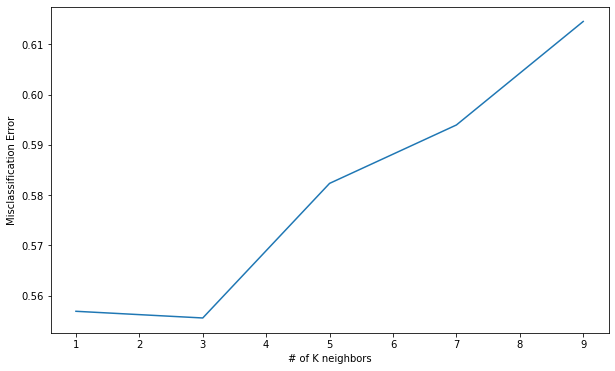

In [35]:
#Plotting Error
from sklearn.model_selection import cross_val_score
neighbors = []
cv_scores = []

for k in (1,3,5,7,9):
    neighbors.append(k)
    knn = KNeighborsClassifier(n_neighbors = k)
    scores = cross_val_score(knn, train_vectors, y_train, cv = 10, scoring='accuracy')
    cv_scores.append(scores.mean())

scores = cross_val_score(knn, train_vectors, y_train, cv = 10, scoring='accuracy')
print(scores)

MSE = [1-x for x in cv_scores]
optimal_k = neighbors[MSE.index(min(MSE))]
print('The optimal # of K neighbors: %d ' %optimal_k)

plt.figure(figsize = (10,6))
plt.plot(neighbors, MSE)
plt.xlabel('# of K neighbors')
plt.ylabel('Misclassification Error')
plt.show()

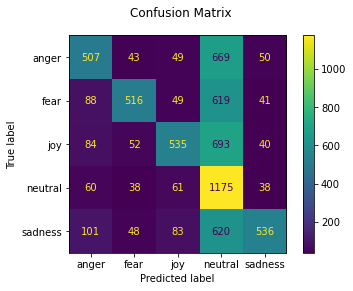

In [36]:
from sklearn.metrics import plot_confusion_matrix

#Plotting confusion matrix for visualization of how correct the predictions were
fig = plot_confusion_matrix(knn.fit(train_vectors, y_train), train_vectors, y_train)
fig.figure_.suptitle("Confusion Matrix")
plt.show()

In [27]:
#Naive Bayes 
#TF-IDF model
tdf = TfidfVectorizer(stop_words='english',max_features=600)
tfidf = tdf.fit(X_train)
print(tfidf.vocabulary_)
tfidfVectorTrain = tfidf.transform(X_train)
tfidfVectorTest= tfidf.transform(X_test)

g_nb = GaussianNB()
gnb = g_nb.fit(tfidfVectorTrain.toarray(), y_train) #.fit you see a lot 
y_pred = gnb.predict(tfidfVectorTest.toarray())

#Classification report for NB
print(classification_report(y_test, y_pred))

print('NB accuracy score: ', accuracy_score(y_test, y_pred))

{'boyfriend': 46, 'admitted': 7, 'university': 543, 'really': 416, 'sad': 436, 'story': 485, 'ago': 10, 'wife': 571, 'told': 521, 'bad': 29, 'make': 322, 'worse': 586, 'let': 291, 'use': 545, 'people': 388, 'parents': 381, 'called': 57, 'late': 282, 'said': 438, 'time': 517, 'date': 98, 'gave': 201, 'child': 71, 'saw': 440, 'love': 318, 'hear': 235, 'feel': 171, 'face': 161, 'city': 76, 'eyes': 160, 'friend': 192, 'promised': 407, 'come': 85, 'place': 394, 'turn': 535, 'heard': 236, 'father': 168, 'involved': 269, 'car': 60, 'accident': 4, 'happened': 229, 'gone': 210, 'stolen': 482, 'like': 296, 'anxious': 20, 'state': 478, 'trip': 531, 'hands': 227, 'things': 512, 'morning': 351, 'example': 149, 'got': 213, 'totally': 525, 'busy': 54, 'way': 564, 'work': 580, 'working': 582, 'hour': 255, 'im': 264, 'dead': 102, 'tired': 519, 'taking': 496, 'afraid': 8, 'overjoyed': 379, 'difficult': 118, 'excitement': 153, 'passed': 385, 'away': 27, 'short': 455, 'illness': 263, 'months': 349, 'old':

              precision    recall  f1-score   support

       anger       0.64      0.42      0.51       449
        fear       0.68      0.42      0.52       414
         joy       0.56      0.53      0.55       483
     neutral       0.42      0.87      0.56       449
     sadness       0.59      0.39      0.47       471

    accuracy                           0.53      2266
   macro avg       0.58      0.53      0.52      2266
weighted avg       0.58      0.53      0.52      2266

NB accuracy score:  0.5286849073256841


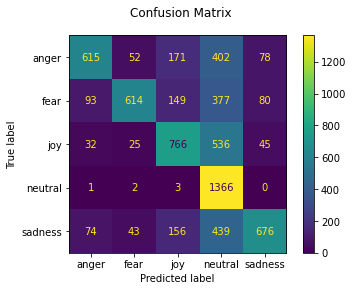

In [28]:
fig = plot_confusion_matrix(gnb, tfidfVectorTrain.toarray(), y_train)
fig.figure_.suptitle("Confusion Matrix")
plt.show()

In [39]:
#Decision Tree
#TF-IDF model
tdf = TfidfVectorizer(stop_words='english', norm = 'l2', ngram_range=(1,2))
tfidf = tdf.fit(X_train)
print(tfidf.vocabulary_)
#print(tfidf.idf_)
tfidfVectorTrain = tfidf.transform(X_train)
tfidfVectorTest= tfidf.transform(X_test)

dt = tree.DecisionTreeClassifier(criterion='entropy')
dt.fit(tfidfVectorTrain, y_train)
y_pred_tfidf = dt.predict(tfidfVectorTest)
accuracy = accuracy_score(y_test, y_pred_tfidf)
print('DecisionTreeClassifier accuracy score: {}'.format(accuracy))

#Classification report
print(classification_report(y_test, y_pred_tfidf))

{'quarrelled': 28896, 'boyfriend': 3857, 'quarrelled boyfriend': 28898, 'admitted': 482, 'university': 38981, 'admitted university': 498, 'really': 29445, 'sad': 31238, 'story': 34878, 'trace': 37994, 'luggage': 22362, 'really sad': 29539, 'sad story': 31314, 'story trace': 34889, 'trace luggage': 37996, 'monthe': 23992, 'ago': 771, 'brothers': 4225, 'wife': 40794, 'told': 37634, 'bad': 2507, 'manners': 22772, 'make': 22526, 'matters': 23014, 'worse': 41376, 'let': 20877, 'use': 39212, 'telephone': 36293, 'allowed': 1001, 'people': 26883, 'tribe': 38210, 'monthe ago': 23993, 'ago brothers': 775, 'brothers wife': 4232, 'wife told': 40820, 'told bad': 37639, 'bad manners': 2539, 'manners make': 22774, 'make matters': 22548, 'matters worse': 23016, 'worse let': 41382, 'let use': 20925, 'use telephone': 39239, 'telephone allowed': 36294, 'allowed people': 1004, 'people tribe': 26978, 'parents': 26406, 'called': 4539, 'usual': 39300, 'reminded': 30171, 'plan': 27520, 'marry': 22893, 'late':

DecisionTreeClassifier accuracy score: 0.6054721977052074
              precision    recall  f1-score   support

       anger       0.54      0.50      0.52       449
        fear       0.69      0.59      0.63       414
         joy       0.58      0.58      0.58       483
     neutral       0.58      0.73      0.65       449
     sadness       0.65      0.63      0.64       471

    accuracy                           0.61      2266
   macro avg       0.61      0.61      0.60      2266
weighted avg       0.61      0.61      0.60      2266



In [30]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree
import graphviz

# DOT data
dot_data = tree.export_graphviz(dt, out_file=None, filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

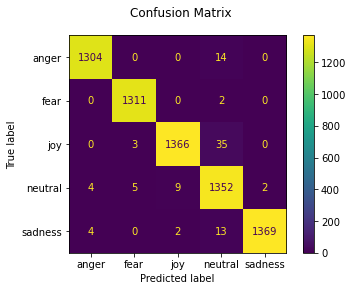

In [40]:
fig = plot_confusion_matrix(dt.fit(tfidfVectorTrain, y_train), tfidfVectorTrain, y_train)
fig.figure_.suptitle("Confusion Matrix")
plt.show()

In [45]:
#MLP Neural Network
#TF-IDF model
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

tdf = TfidfVectorizer(stop_words='english',max_features=600)
tfidf = tdf.fit(X_train)
print(tfidf.vocabulary_)
tfidfVectorTrain = tfidf.transform(X_train)
tfidfVectorTest= tfidf.transform(X_test)

from sklearn.neural_network import MLPClassifier

#Hidden layers = how many neurons and layers
mlpTrain = MLPClassifier(alpha=1e-1, hidden_layer_sizes=(50, 2))
mlpModel = mlpTrain.fit(tfidfVectorTrain.toarray(), y_train)   #training model
y_pred = mlpModel.predict(tfidfVectorTest.toarray()) #predictive model

print(classification_report(y_test, y_pred))

print('MLP accuracy score: ', accuracy_score(y_test, y_pred))

{'boyfriend': 46, 'admitted': 7, 'university': 543, 'really': 416, 'sad': 436, 'story': 485, 'ago': 10, 'wife': 571, 'told': 521, 'bad': 29, 'make': 322, 'worse': 586, 'let': 291, 'use': 545, 'people': 388, 'parents': 381, 'called': 57, 'late': 282, 'said': 438, 'time': 517, 'date': 98, 'gave': 201, 'child': 71, 'saw': 440, 'love': 318, 'hear': 235, 'feel': 171, 'face': 161, 'city': 76, 'eyes': 160, 'friend': 192, 'promised': 407, 'come': 85, 'place': 394, 'turn': 535, 'heard': 236, 'father': 168, 'involved': 269, 'car': 60, 'accident': 4, 'happened': 229, 'gone': 210, 'stolen': 482, 'like': 296, 'anxious': 20, 'state': 478, 'trip': 531, 'hands': 227, 'things': 512, 'morning': 351, 'example': 149, 'got': 213, 'totally': 525, 'busy': 54, 'way': 564, 'work': 580, 'working': 582, 'hour': 255, 'im': 264, 'dead': 102, 'tired': 519, 'taking': 496, 'afraid': 8, 'overjoyed': 379, 'difficult': 118, 'excitement': 153, 'passed': 385, 'away': 27, 'short': 455, 'illness': 263, 'months': 349, 'old':

              precision    recall  f1-score   support

       anger       0.58      0.60      0.59       449
        fear       0.64      0.60      0.62       414
         joy       0.63      0.57      0.60       483
     neutral       0.58      0.69      0.63       449
     sadness       0.59      0.56      0.57       471

    accuracy                           0.60      2266
   macro avg       0.60      0.60      0.60      2266
weighted avg       0.60      0.60      0.60      2266

MLP accuracy score:  0.6015004413062666


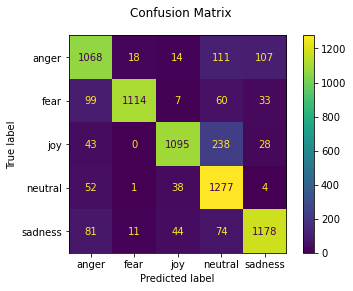

In [46]:
fig = plot_confusion_matrix(mlpModel, tfidfVectorTrain.toarray(), y_train)
fig.figure_.suptitle("Confusion Matrix")
plt.show()